In [1]:
#import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import requests

%matplotlib inline

# Report of French Employment, Salaries, Population

### Table of Contents
* [1. Basic info](#chapter1)
* [2 Data loading and cleaning](#chapter2)
    * [Section 1.1](#section_1_1)
    * [Section 1.2](#section_1_2)
* [3. Data analysis](#chapter3)
    * [3.1. Current French labour market information](#section_3_1)
        * [3.1.1. The unemployment rate](#section_3_1_1)
        * [3.1.2. Mean salary for France](#section_3_1_2)
        * [3.1.3. Mean salary by working position](#section_3_1_3) 
        * [3.1.4. Mean salary by age](#section_3_1_4)
    * [3.2. Labour situation by regions](#section_3_2)
        * [3.2.1. Mean salary per region](#section_3_2_1)
        * [3.2.2. Regions with the lowest and highest salaries](#section_3_2_2) 
        * [3.2.3. Salary per region and gender](#section_3_2_3) 
    * [3.3. Labour situation by cities](#section_3_3)
        * [3.3.1. Mean salary per town](#section_3_3_1)
        * [3.3.2. Mean salary per town and gender](#section_3_3_2) 
        * [3.3.3. Mean salary per town and age](#section_3_3_3)

# 1. Basic info <a class="anchor" id="chapter1"></a>

Dataset is coming from **INSEE**. INSEE is the official french institute gathering data of many types around France. 
It can be demographic (Births, Deaths, Population Density…), Economic (Salary, Firms by activity / size…) and more. Data and descriptin can be found at <a href=" https://www.kaggle.com/etiennelq/french-employment-by-town?select=net_salary_per_town_categories.csv">this link</a>. Four files are in the dataset:

**baseetablissementpartrancheeffectif** : give information on the number of firms in every french town, categorized by size , come from INSEE. 
- CODGEO : geographique code for the town (can be joined with codeinsee column from "namegeographic_information.csv')
- LIBGEO : name of the town (in french) 
- REG : region number 
- DEP : depatment number 
- E14TST : total number of firms in the town 
- E14TS0ND : number of unknown or null size firms in the town 
- E14TS1 : number of firms with 1 to 5 employees in the town 
- E14TS6 : number of firms with 6 to 9 employees in the town 
- E14TS10 : number of firms with 10 to 19 employees in the town
- E14TS20 : number of firms with 20 to 49 employees in the town
- E14TS50 : number of firms with 50 to 99 employees in the town
- E14TS100 : number of firms with 100 to 199 employees in the town
- E14TS200 : number of firms with 200 to 499 employees in the town
- E14TS500 : number of firms with more than 500 employees in the town

**namegeographicinformation** : give geographic data on french town (mainly latitude and longitude, but also region / department codes and names )
- EU_circo : name of the European Union Circonscription
- code_région : code of the region attached to the town
- nom_région : name of the region attached to the town
- chef.lieu_région : name the administrative center around the town
- numéro_département : code of the department attached to the town
- nom_département : name of the department attached to the town
- préfecture : name of the local administrative division around the town
- numéro_circonscription : number of the circumpscription
- nom_commune : name of the town
- codes_postaux : post-codes relative to the town
- code_insee : unique code for the town
- latitude : GPS latitude
- longitude : GPS longitude
- éloignement

**netsalarypertownper_category** : salaries around french town per job categories, age and sex
- CODGEO : unique code of the town
- LIBGEO : name of the town
- SNHM14 : mean net salary
- SNHMC14 : mean net salary per hour for executive
- SNHMP14 : mean net salary per hour for middle manager
- SNHME14 : mean net salary per hour for employee
- SNHMO14 : mean net salary per hour for worker
- SNHMF14 : mean net salary for women
- SNHMFC14 : mean net salary per hour for feminin executive
- SNHMFP14 : mean net salary per hour for feminin middle manager
- SNHMFE14 : mean net salary per hour for feminin employee
- SNHMFO14 : mean net salary per hour for feminin worker
- SNHMH14 : mean net salary for man
- SNHMHC14 : mean net salary per hour for masculin executive
- SNHMHP14 : mean net salary per hour for masculin middle manager
- SNHMHE14 : mean net salary per hour for masculin employee
- SNHMHO14 : mean net salary per hour for masculin worker
- SNHM1814 : mean net salary per hour for 18-25 years old
- SNHM2614 : mean net salary per hour for 26-50 years old
- SNHM5014 : mean net salary per hour for >50 years old
- SNHMF1814 : mean net salary per hour for women between 18-25 years old
- SNHMF2614 : mean net salary per hour for women between 26-50 years old
- SNHMF5014 : mean net salary per hour for women >50 years old
- SNHMH1814 : mean net salary per hour for men between 18-25 years old
- SNHMH2614 : mean net salary per hour for men between 26-50 years old
- SNHMH5014 : mean net salary per hour for men >50 years old

**population** : demographic information in France per town, age, sex and living mode
- <NIVGEO : geographic level (arrondissement, communes…)
- CODGEO : unique code for the town
- LIBGEO : name of the town (might contain some utf-8 errors, this information has better quality namegeographicinformation)
- MOCO : cohabitation mode : [list and meaning available in Data description]
- AGE80_17 : age category (slice of 5 years) | ex : 0 -> people between 0 and 4 years old
- SEXE : sex, 1 for men | 2 for women
- NB : number of people in the category

**departments.geojson** : contains the borders of french departments. From Gregoire David (github)


This report is using only **netsalarypertownper_category** and **name_geographic_information** parts. Other files are described for further analysis purposes if needed. These datasets can be merged by : CODGEO = code_insee.



# 2. Data loading and cleaning <a class="anchor" id="chapter2"></a>

In [2]:
#load basic data
data_1 = pd.read_csv("net_salary_per_town_categories.csv")

In [3]:
#create headers more intuitive for people reading report
headers_1  = {"CODGEO" : "unique code of the town",
"LIBGEO" : "name of the town",
"SNHM14" : "mean net salary",
"SNHMC14" : "mean net salary per hour for executive",
"SNHMP14" : "mean net salary per hour for middle manager",
"SNHME14" : "mean net salary per hour for employee",
"SNHMO14" : "mean net salary per hour for worker",
"SNHMF14" : "mean net salary for women",
"SNHMFC14" : "mean net salary per hour for feminin executive",
"SNHMFP14" : "mean net salary per hour for feminin middle manager",
"SNHMFE14" : "mean net salary per hour for feminin employee",
"SNHMFO14" : "mean net salary per hour for feminin worker",
"SNHMH14" : "mean net salary for man",
"SNHMHC14" : "mean net salary per hour for masculin executive",
"SNHMHP14" : "mean net salary per hour for masculin middle manager",
"SNHMHE14" : "mean net salary per hour for masculin employee",
"SNHMHO14" : "mean net salary per hour for masculin worker",
"SNHM1814" : "mean net salary per hour for 18-25 years old",
"SNHM2614" : "mean net salary per hour for 26-50 years old",
"SNHM5014" : "mean net salary per hour for >50 years old",
"SNHMF1814" : "mean net salary per hour for women between 18-25 years old",
"SNHMF2614" : "mean net salary per hour for women between 26-50 years old",
"SNHMF5014" : "mean net salary per hour for women >50 years old",
"SNHMH1814" : "mean net salary per hour for men between 18-25 years old",
"SNHMH2614" : "mean net salary per hour for men between 26-50 years old",
"SNHMH5014" : "mean net salary per hour for men >50 years old"}

In [4]:
data_1.rename(columns = headers_1, inplace=True)

In [5]:
data_1.head(10)

,unique code of the town,name of the town,mean net salary,mean net salary per hour for executive,mean net salary per hour for middle manager,mean net salary per hour for employee,mean net salary per hour for worker,mean net salary for women,mean net salary per hour for feminin executive,mean net salary per hour for feminin middle manager,...,mean net salary per hour for masculin worker,mean net salary per hour for 18-25 years old,mean net salary per hour for 26-50 years old,mean net salary per hour for >50 years old,mean net salary per hour for women between 18-25 years old,mean net salary per hour for women between 26-50 years old,mean net salary per hour for women >50 years old,mean net salary per hour for men between 18-25 years old,mean net salary per hour for men between 26-50 years old,mean net salary per hour for men >50 years old
0,01004,Ambérieu-en-Bugey,13.7,24.2,15.5,10.3,11.2,11.6,19.1,13.2,...,11.6,10.5,13.7,16.1,9.7,11.8,12.5,11.0,14.9,18.6
1,01007,Ambronay,13.5,22.1,14.7,10.7,11.4,11.9,19.0,13.3,...,11.7,9.8,13.8,14.6,9.2,12.2,12.5,10.2,14.9,16.4
2,01014,Arbent,13.5,27.6,15.6,11.1,11.1,10.9,19.5,11.7,...,11.8,9.3,13.3,16.0,8.9,10.6,12.5,9.6,15.1,18.6
3,01024,Attignat,12.9,21.8,14.1,11.0,11.3,11.4,19.0,13.0,...,11.6,9.6,12.9,14.2,9.3,11.4,12.2,9.7,13.8,15.9
4,01025,Bâgé-la-Ville,13.0,22.8,14.1,10.5,11.1,11.6,19.4,13.6,...,11.4,9.4,12.8,15.2,9.0,11.8,12.3,9.7,13.4,16.9
5,01027,Balan,13.9,22.2,15.1,11.0,11.4,12.5,20.3,14.0,...,11.7,9.7,14.1,15.4,9.5,12.8,13.0,9.9,15.3,17.2
6,01031,Bellignat,12.4,24.0,13.1,10.5,10.4,10.9,20.7,11.8,...,10.8,9.3,12.5,13.3,8.9,11.0,11.5,9.6,13.3,14.9
7,01032,Béligneux,14.0,23.1,15.3,10.9,11.3,12.4,20.5,13.9,...,11.6,9.7,13.9,16.7,9.7,12.4,13.8,9.6,15.0,19.3
8,01033,Bellegarde-sur-Valserine,11.5,21.2,13.5,9.9,10.5,10.3,20.8,12.3,...,11.0,9.6,11.5,12.7,9.2,10.3,11.3,10.0,12.3,13.9
9,01034,Belley,12.4,23.4,14.1,10.3,10.5,11.0,21.5,13.0,...,10.9,9.7,12.3,13.7,9.3,11.2,11.4,9.9,13.0,15.4


In [6]:
#no missing values
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5136 entries, 0 to 5135
Data columns (total 26 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   unique code of the town                                     5136 non-null   object 
 1   name of the town                                            5136 non-null   object 
 2   mean net salary                                             5136 non-null   float64
 3   mean net salary per hour for executive                      5136 non-null   float64
 4   mean net salary per hour for middle manager                 5136 non-null   float64
 5   mean net salary per hour for employee                       5136 non-null   float64
 6   mean net salary per hour for worker                         5136 non-null   float64
 7   mean net salary for women                                   5136 non-null   float64
 8 

In [7]:
data_1.describe()

,mean net salary,mean net salary per hour for executive,mean net salary per hour for middle manager,mean net salary per hour for employee,mean net salary per hour for worker,mean net salary for women,mean net salary per hour for feminin executive,mean net salary per hour for feminin middle manager,mean net salary per hour for feminin employee,mean net salary per hour for feminin worker,...,mean net salary per hour for masculin worker,mean net salary per hour for 18-25 years old,mean net salary per hour for 26-50 years old,mean net salary per hour for >50 years old,mean net salary per hour for women between 18-25 years old,mean net salary per hour for women between 26-50 years old,mean net salary per hour for women >50 years old,mean net salary per hour for men between 18-25 years old,mean net salary per hour for men between 26-50 years old,mean net salary per hour for men >50 years old
count,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,...,5136.000000,5136.000000,5136.000000,5136.00000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000
mean,13.706386,23.703836,14.575876,10.564505,11.235650,12.038026,20.220502,13.274260,10.308879,9.827161,...,11.498189,9.549766,13.495444,15.87722,9.161565,12.055160,13.174143,9.820872,14.485981,17.679809
std,2.559329,2.836183,1.490110,0.811775,1.221755,1.787995,2.327550,0.990166,0.747563,1.104684,...,1.289598,0.997444,2.363144,3.58586,0.453023,1.825306,2.249391,1.539949,2.852490,4.530257
min,10.200000,16.000000,11.600000,8.700000,8.300000,9.300000,12.000000,10.600000,8.700000,6.100000,...,8.900000,7.900000,9.700000,10.50000,7.500000,9.100000,9.500000,7.800000,9.600000,10.800000
25%,12.100000,21.900000,13.800000,10.000000,10.600000,10.900000,18.800000,12.600000,9.800000,9.200000,...,10.800000,9.200000,12.000000,13.70000,8.900000,10.900000,11.700000,9.400000,12.700000,14.900000
50%,13.000000,23.200000,14.400000,10.400000,11.000000,11.500000,20.000000,13.100000,10.100000,9.700000,...,11.300000,9.500000,12.900000,15.00000,9.100000,11.600000,12.600000,9.700000,13.800000,16.600000
75%,14.400000,24.900000,15.100000,10.900000,11.600000,12.700000,21.400000,13.800000,10.600000,10.200000,...,11.900000,9.700000,14.300000,16.90000,9.400000,12.700000,14.000000,10.000000,15.500000,19.000000
max,43.300000,51.500000,54.600000,17.500000,46.300000,26.700000,35.500000,19.000000,16.100000,28.100000,...,53.200000,60.600000,38.100000,56.90000,12.000000,26.600000,31.000000,93.300000,45.400000,68.600000


In [8]:
#load region info
data_2 = pd.read_csv("name_geographic_information.csv")

In [9]:
data_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36840 entries, 0 to 36839
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   EU_circo                36840 non-null  object 
 1   code_région             36840 non-null  int64  
 2   nom_région              36840 non-null  object 
 3   chef.lieu_région        36840 non-null  object 
 4   numéro_département      36840 non-null  object 
 5   nom_département         36840 non-null  object 
 6   préfecture              36840 non-null  object 
 7   numéro_circonscription  36840 non-null  int64  
 8   nom_commune             36840 non-null  object 
 9   codes_postaux           36840 non-null  object 
 10  code_insee              36840 non-null  int64  
 11  latitude                33911 non-null  float64
 12  longitude               33999 non-null  object 
 13  éloignement             33878 non-null  float64
dtypes: float64(2), int64(3), object(9)
mem

# 3. Data analysis <a class="anchor" id="chapter3"></a>

## 3.1. Current French labour market information <a class="anchor" id="section_3_1"></a>

### 3.1.1. The unemployment rate <a class="anchor" id="section_3_1_1"></a>

In Q1 2021 the unemployment rate in France has reached 8.1%.

### 3.1.2. Mean salary for France <a class="anchor" id="section_3_1_2"></a>

In [10]:
print("The average net salary per hour for the whole country currently achieved: {:.2f}€. For womens it is {:.2f}€, and for mens {:.2f}€".format(data_1['mean net salary'].mean(), data_1['mean net salary for women'].mean(), data_1['mean net salary for man'].mean()))

The average net salary per hour for the whole country currently achieved: 13.71€. For womens it is 12.04€, and for mens 14.85€


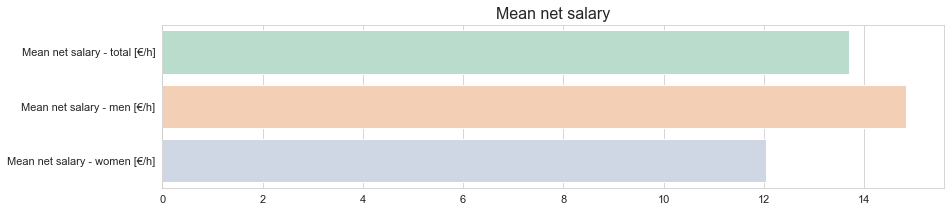

In [11]:
data_plot_1  = [data_1['mean net salary'].mean(), data_1['mean net salary for man'].mean(), data_1['mean net salary for women'].mean()]
labels = ['Mean net salary - total [€/h]', 'Mean net salary - men [€/h]', 'Mean net salary - women [€/h]']

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,3))

sns.barplot(x = data_plot_1, y = labels, palette = 'Pastel2')
ax.set_title("Mean net salary", fontsize = 16)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()

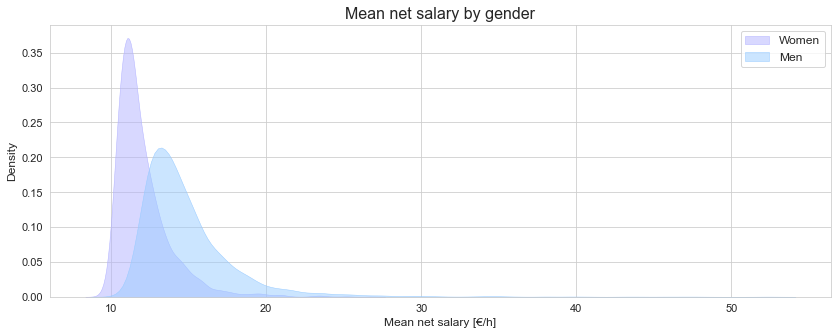

In [12]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,5))

sns.kdeplot(data_1['mean net salary for women'], color = "#b3b3ff", fill = True, alpha = .5, linewidth = 0.5, label = 'Women')
sns.kdeplot(data_1['mean net salary for man'], color = "#99ccff", fill = True, alpha = .5, linewidth = 0.5, label = 'Men')
ax.set_title("Mean net salary by gender", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Density", fontsize = 12)
ax.legend(fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()

### 3.1.3. Mean salary by working position <a class="anchor" id="section_3_1_3"></a>

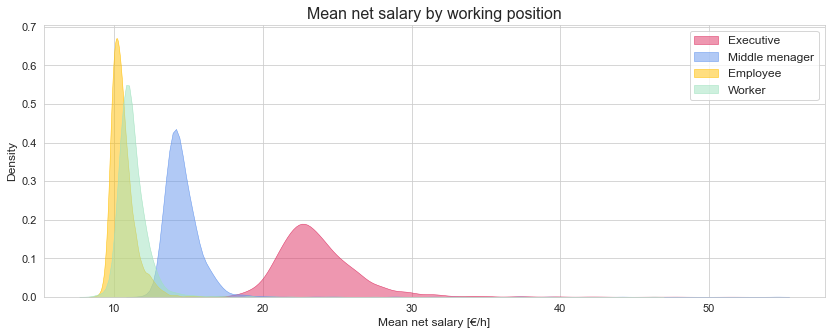

In [13]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,5))

sns.kdeplot(data_1['mean net salary per hour for executive'], color = "#DE3163", fill = True, alpha = .5, linewidth = 0.5, label = 'Executive')
sns.kdeplot(data_1['mean net salary per hour for middle manager'], color = "#6495ED", fill = True, alpha = .5, linewidth = 0.5, label = 'Middle menager')
sns.kdeplot(data_1['mean net salary per hour for employee'], color = "#FFBF00", fill = True, alpha = .5, linewidth = 0.5, label = 'Employee')
sns.kdeplot(data_1['mean net salary per hour for worker'], color = "#9FE2BF", fill = True, alpha = .5, linewidth = 0.5, label = 'Worker')

ax.set_title("Mean net salary by working position", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Density", fontsize = 12)
ax.legend(fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()

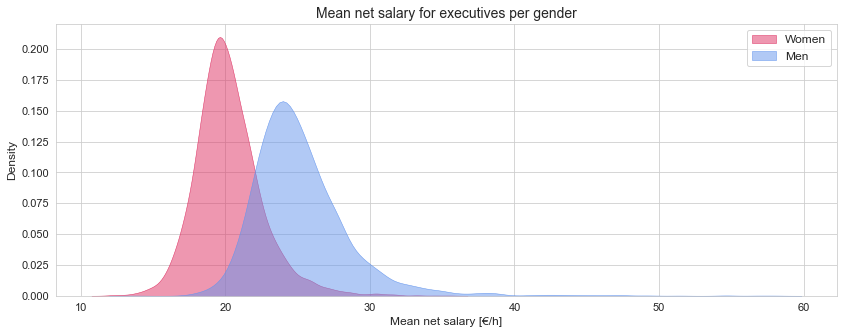

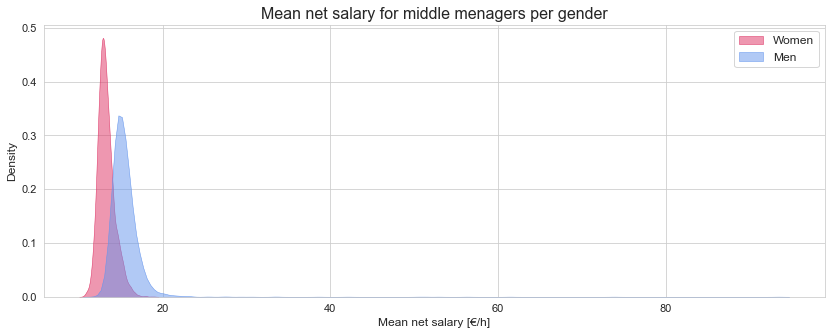

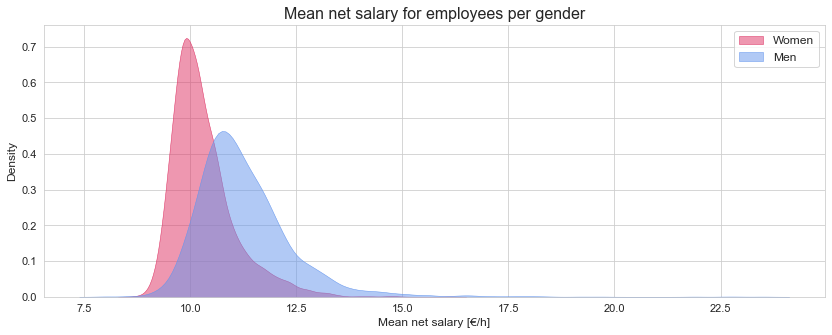

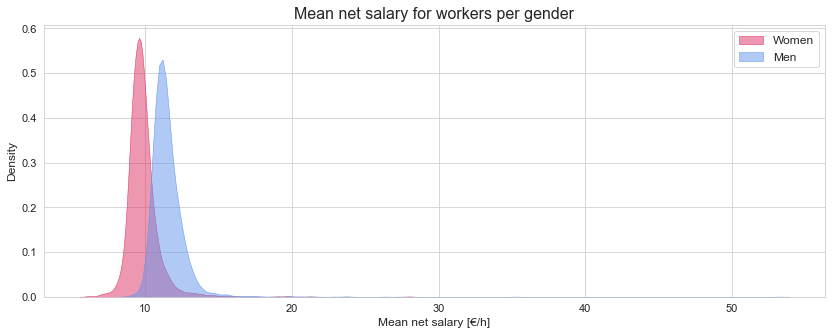

In [14]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,5))
 
sns.kdeplot(data_1['mean net salary per hour for feminin executive'], color = "#DE3163", fill = True, alpha = .5, linewidth = 0.5, label = 'Women')
sns.kdeplot(data_1['mean net salary per hour for masculin executive'], color = "#6495ED", fill = True, alpha = .5, linewidth = 0.5, label = 'Men')

ax.set_title("Mean net salary for executives per gender", fontsize = 14)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Density", fontsize = 12)
ax.legend(fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()


sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,5))
  
sns.kdeplot(data_1['mean net salary per hour for feminin middle manager'], color = "#DE3163", fill = True, alpha = .5, linewidth = 0.5, label = 'Women')
sns.kdeplot(data_1['mean net salary per hour for masculin middle manager'], color = "#6495ED", fill = True, alpha = .5, linewidth = 0.5, label = 'Men')

ax.set_title("Mean net salary for middle menagers per gender", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Density", fontsize = 12)
ax.legend(fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()


sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,5))

sns.kdeplot(data_1['mean net salary per hour for feminin employee'], color = "#DE3163", fill = True, alpha = .5, linewidth = 0.5, label = 'Women')
sns.kdeplot(data_1['mean net salary per hour for masculin employee'], color = "#6495ED", fill = True, alpha = .5, linewidth = 0.5, label = 'Men')

ax.set_title("Mean net salary for employees per gender", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Density", fontsize = 12)
ax.legend(fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()


sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,5))

sns.kdeplot(data_1['mean net salary per hour for feminin worker'], color = "#DE3163", fill = True, alpha = .5, linewidth = 0.5, label = 'Women')
sns.kdeplot(data_1['mean net salary per hour for masculin worker'], color = "#6495ED", fill = True, alpha = .5, linewidth = 0.5, label = 'Men')

ax.set_title("Mean net salary for workers per gender", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Density", fontsize = 12)
ax.legend(fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()

### 3.1.4. Mean salary by age <a class="anchor" id="section_3_1_4"></a>

Net payment is starting to grow with the age. The discrepancies between gender payments are getting more visible with the age.

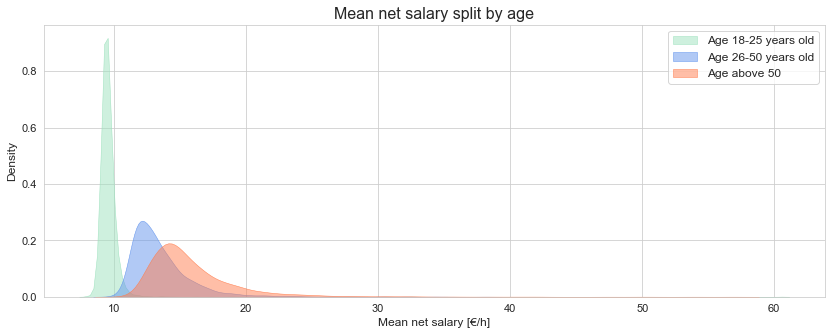

In [15]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,5))
    
sns.kdeplot(data_1['mean net salary per hour for 18-25 years old'], color = "#9FE2BF", fill = True, alpha = .5, linewidth = 0.5, label = 'Age 18-25 years old')
sns.kdeplot(data_1['mean net salary per hour for 26-50 years old'], color = "#6495ED", fill = True, alpha = .5, linewidth = 0.5, label = 'Age 26-50 years old')
sns.kdeplot(data_1['mean net salary per hour for >50 years old'], color = "#FF7F50", fill = True, alpha = .5, linewidth = 0.5, label = 'Age above 50')

ax.set_title("Mean net salary split by age", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Density", fontsize = 12)
ax.legend(fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()

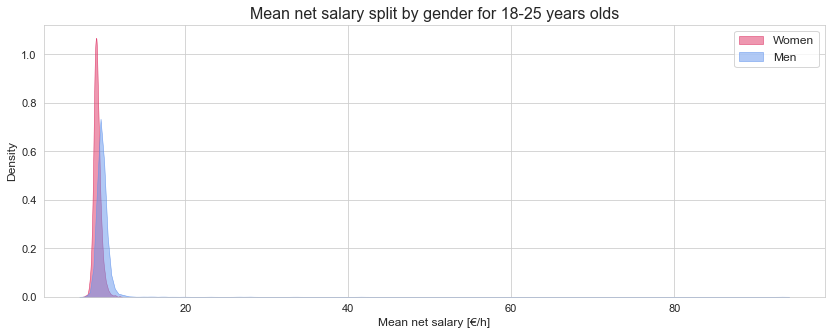

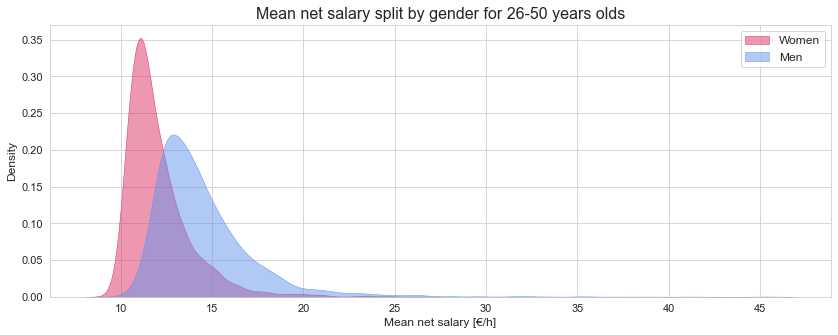

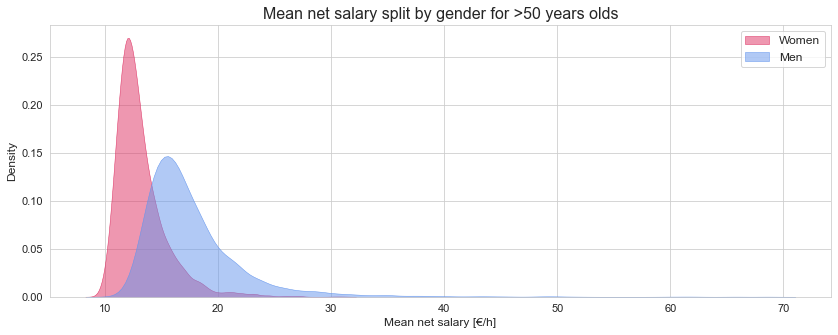

In [16]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,5))

sns.kdeplot(data_1['mean net salary per hour for women between 18-25 years old'], color = "#DE3163", fill = True, alpha = .5, linewidth = 0.5, label = 'Women')
sns.kdeplot(data_1['mean net salary per hour for men between 18-25 years old'], color = "#6495ED", fill = True, alpha = .5, linewidth = 0.5, label = 'Men')

ax.set_title("Mean net salary split by gender for 18-25 years olds", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Density", fontsize = 12)
ax.legend(fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()


sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,5))
   
sns.kdeplot(data_1['mean net salary per hour for women between 26-50 years old'], color = "#DE3163", fill = True, alpha = .5, linewidth = 0.5, label = 'Women')
sns.kdeplot(data_1['mean net salary per hour for men between 26-50 years old'], color = "#6495ED", fill = True, alpha = .5, linewidth = 0.5, label = 'Men')

ax.set_title("Mean net salary split by gender for 26-50 years olds", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Density", fontsize = 12)
ax.legend(fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()


sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,5))
   
sns.kdeplot(data_1['mean net salary per hour for women >50 years old'], color = "#DE3163", fill = True, alpha = .5, linewidth = 0.5, label = 'Women')
sns.kdeplot(data_1['mean net salary per hour for men >50 years old'], color = "#6495ED", fill = True, alpha = .5, linewidth = 0.5, label = 'Men')

ax.set_title("Mean net salary split by gender for >50 years olds", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Density", fontsize = 12)
ax.legend(fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()

## 3.2. Labour situation by regions <a class="anchor" id="section_3_2"></a>

### 3.2.1. Mean salary per region <a class="anchor" id="section_3_2_1"></a>
Some of France Regions have been merged during last period. Data have been updated to reflect those changes and new Region names.

In [17]:
#separate regions 
data_regions = data_2[['code_insee', 'EU_circo', 'code_région', 'nom_région', 'chef.lieu_région']]

In [18]:
data_regions = data_regions.drop_duplicates()

In [19]:
#pad with 0s to get 5 digits
data_regions['code_insee'] = data_regions['code_insee'].apply(lambda x: '{0:0>5}'.format(x))

In [20]:
data_regions

,code_insee,EU_circo,code_région,nom_région,chef.lieu_région
0,01024,Sud-Est,82,Rhône-Alpes,Lyon
1,01029,Sud-Est,82,Rhône-Alpes,Lyon
2,01038,Sud-Est,82,Rhône-Alpes,Lyon
3,01040,Sud-Est,82,Rhône-Alpes,Lyon
4,01245,Sud-Est,82,Rhône-Alpes,Lyon
...,...,...,...,...,...
36835,97613,Outre-Mer,5,Mayotte,Mamoudzou
36836,97614,Outre-Mer,5,Mayotte,Mamoudzou
36837,97615,Outre-Mer,5,Mayotte,Mamoudzou
36838,97616,Outre-Mer,5,Mayotte,Mamoudzou


In [21]:
#do the same thing for live for 1st file. Pad with 0s
data_1['unique code of the town'] = data_1['unique code of the town'].apply(lambda x: '{0:0>5}'.format(x))

In [22]:
#merge data with region names to data with salaries
data_3 = data_1.merge(data_regions, left_on = 'unique code of the town', right_on = 'code_insee')

In [23]:
#create dictionary with old and new region names
region_update = {
    'Auvergne' : 'Auvergne-Rhône-Alpes',
    'Rhône-Alpes' : 'Auvergne-Rhône-Alpes',
    'Burgundy' : 'Bourgogne-Franche-Comté',
    'Bourgogne':'Bourgogne-Franche-Comté',
    'Franche-Comté' : 'Bourgogne-Franche-Comté',
    'Alsace' : 'Grand Est',
    'Champagne-Ardenne' : 'Grand Est',
    'Lorraine' : 'Grand Est',
    'Nord-Pas-de-Calais' : 'Hauts-de-France',
    'Picardie' : 'Hauts-de-France',
    'Picardy' : 'Hauts-de-France',
    'Lower Normandy' : 'Normandie',
    'Upper Normandy' : 'Normandie',
    'Basse-Normandie' : 'Normandie',
    'Haute-Normandie' : 'Normandie',
    'Aquitaine' : 'Nouvelle-Aquitaine',
    'Limousin' : 'Nouvelle-Aquitaine',
    'Poitou-Charentes' : 'Nouvelle-Aquitaine',
    'Languedoc-Roussillon' : 'Occitanie',
    'Midi-Pyrénées' : 'Occitanie',
    'Centre' : 'Centre-Val de Loire',
    'Corse' : 'Corse'
}

In [24]:
def update_regions(row):
    return region_update[row] if row in region_update.keys() else row

In [25]:
data_3['nom_région'] = data_3['nom_région'].apply(update_regions)

In [26]:
#group by region names to get mean salaries for regions
data_geo = data_3.groupby(by='nom_région').mean()
data_geo.reset_index(inplace=True)

In [27]:
#get geojson with regions
france_url = 'https://raw.githubusercontent.com/gregoiredavid/france-geojson/master/regions.geojson'
response = requests.get(france_url)
payload = response.json()

In [28]:
region_map = {}
for feature in payload['features']:
    feature['id'] = feature['properties']['code'] #creating id to map with real file   
    region_map[feature['properties']['nom']] = feature['properties']['code'] #creating same id inside the geojson

In [29]:
def update_codes(row):
    return region_map[row] if row in region_map.keys() else np.NaN

In [30]:
#add region codes to corresponding region names to geo data frame
data_geo['region_code'] = data_geo['nom_région'].apply(update_codes)

In [31]:
fig = px.choropleth_mapbox(data_frame = data_geo, geojson = payload, 
                    locations = 'region_code', #where is mapped id in data
                    color = 'mean net salary', #column will be used for coloring map  
#                    scope='europe', 
                    hover_name = 'nom_région', #names of parts will be taken from here
#                    hover_data = []) #columns data should be additionally showed
                    mapbox_style = 'carto-positron',      #mapbox layers from plotly.
                    center = {'lat': 47, 'lon': 2.3}, #where map should have a center
                    zoom = 4,
                    opacity = 0.4, #visibility
                    title = "Mean net salary per regions [€/h]"
)

fig.update_layout(font_size = 16, 
                  font_color = 'black',
                  title_font_family = "Arial")
fig.show()

### 3.2.2. Regions with the lowest and highest salaries <a class="anchor" id="section_3_2_2"></a>

In [32]:
#create frame sorted by mean net salary per regions
data_per_region_top_low = data_geo.loc[:, ["nom_région", "mean net salary"]].sort_values(by = "mean net salary", ascending = False)

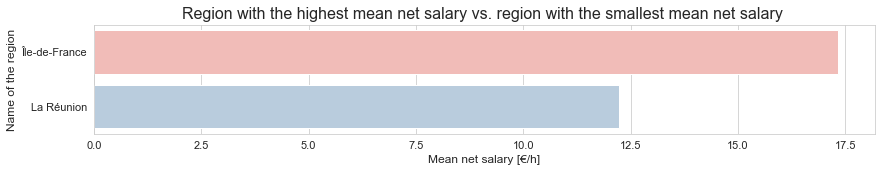

In [33]:
#choose region with the lowest and highest mean net salary value
data_per_region_top_low_1 = pd.concat([data_per_region_top_low[0:1], data_per_region_top_low[-1:]])

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,2))
 
sns.barplot(data = data_per_region_top_low_1, x = data_per_region_top_low_1['mean net salary'], y = data_per_region_top_low_1['nom_région'], palette = 'Pastel1')

ax.set_title("Region with the highest mean net salary vs. region with the smallest mean net salary ", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Name of the region", fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()


### 3.2.3. Salary per region and gender <a class="anchor" id="section_3_2_3"></a>

In [34]:
#calculate new column with sex salary gap per region
data_geo['salary_gap'] = data_geo['mean net salary for man'] - data_geo['mean net salary for women']

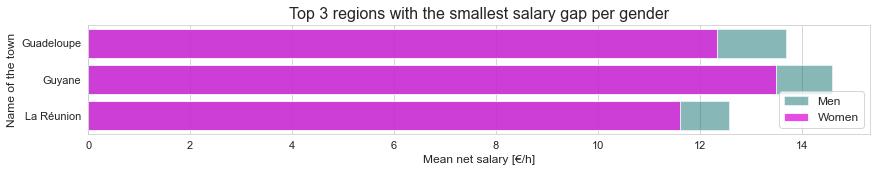

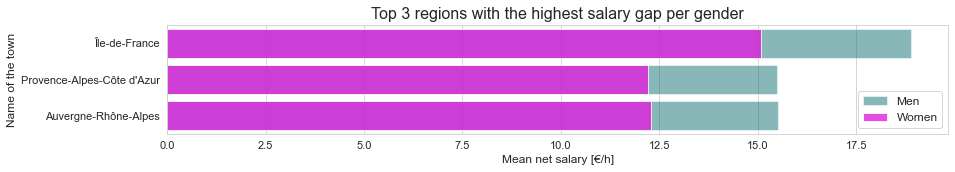

In [35]:
#choose 3 from the bottom (smallest salary gap)
gap_region = data_geo.sort_values(by = 'salary_gap', ascending = False)[-3:]

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,2))

sns.barplot(data = gap_region, x = 'mean net salary for man', y = 'nom_région', alpha = 0.5, color = "#008080", label = 'Men')
sns.barplot(data = gap_region, x = 'mean net salary for women', y = 'nom_région', alpha = 0.8, color = "#FF00FF", label = 'Women')   

ax.set_title("Top 3 regions with the smallest salary gap per gender", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Name of the town", fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)
ax.legend(fontsize = 12)

plt.show()

#choose 3 from the top (smallest salary gap)
gap_region = data_geo.sort_values(by = 'salary_gap', ascending = False)[:3]

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,2))

sns.barplot(data = gap_region, x = 'mean net salary for man', y = 'nom_région', alpha = 0.5, color = "#008080", label = 'Men')
sns.barplot(data = gap_region, x = 'mean net salary for women', y = 'nom_région', alpha = 0.8, color = "#FF00FF", label = 'Women')   

ax.set_title("Top 3 regions with the highest salary gap per gender", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Name of the town", fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)
ax.legend(fontsize = 12)

plt.show()

## 3.3. Labour situation by cities <a class="anchor" id="section_3_3"></a>

### 3.3.1. Mean salary per town <a class="anchor" id="section_3_3_1"></a>

In [36]:
#separate data per town and sort in order to create diagrams per town
data_per_town = data_1.loc[:, ["name of the town", "mean net salary"]].sort_values(by = "mean net salary", ascending = False)

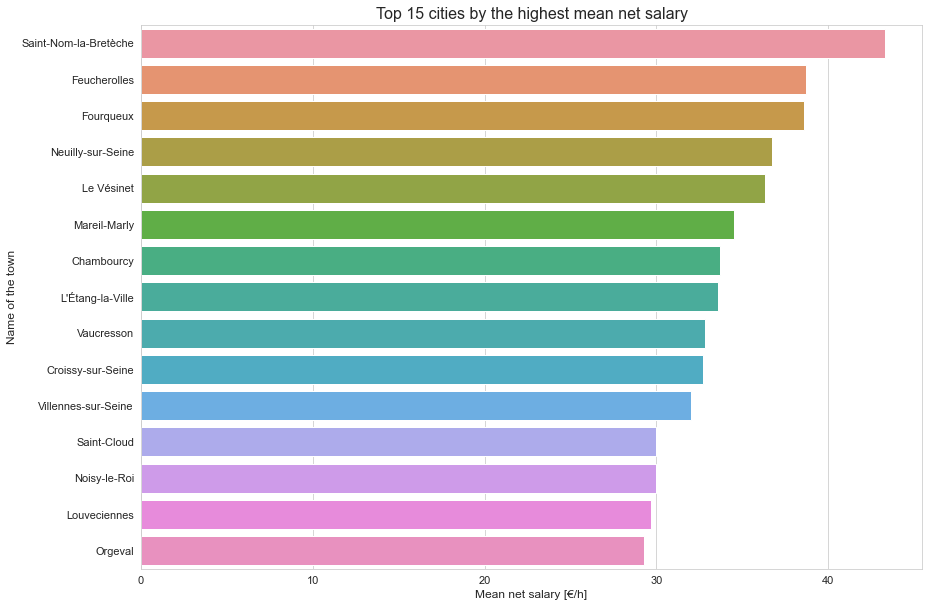

In [37]:
#choose top 15 cities with mean net salary
data_per_town_top_15 = data_per_town[0:15]

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,10))
    
sns.barplot(data = data_per_town_top_15, x = data_per_town_top_15['mean net salary'], y = data_per_town_top_15['name of the town'])

ax.set_title("Top 15 cities by the highest mean net salary", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Name of the town", fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()

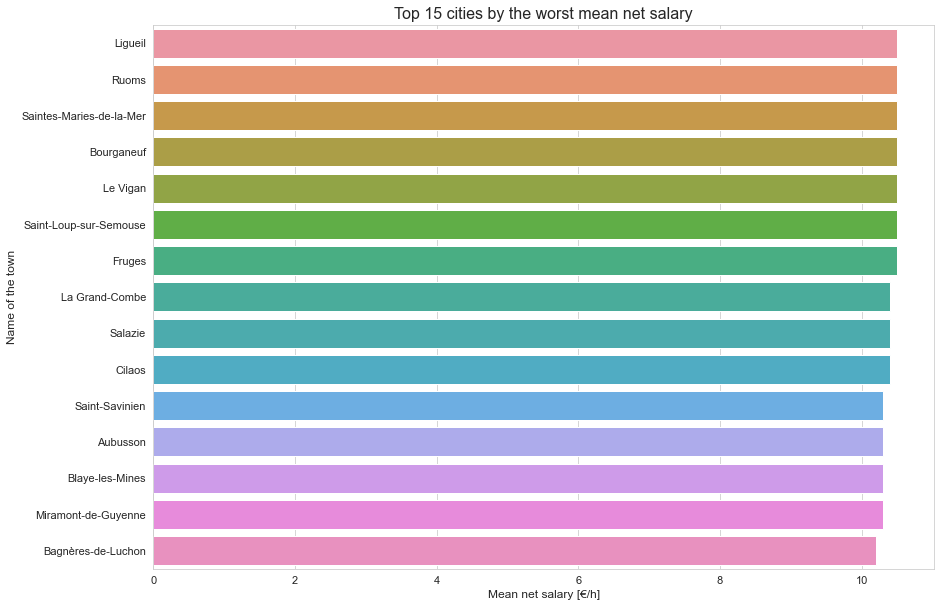

In [38]:
#choose top 15 cities with the lowest mean net salary
data_per_town_worst_15 = data_per_town[-15:]

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,10))

sns.barplot(data = data_per_town_worst_15, x = data_per_town_worst_15['mean net salary'], y = data_per_town_worst_15['name of the town'])

ax.set_title("Top 15 cities by the worst mean net salary", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Name of the town", fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()

### 3.3.2. Mean salary per town and gender <a class="anchor" id="section_3_3_2"></a>

In [39]:
salary_per_town_2 = data_1.loc[:, ["name of the town", "mean net salary", "mean net salary for women", "mean net salary for man"]]

In [40]:
#create column with salary gap per gender by town
salary_per_town_2['gender payment difference (men - woman)'] = salary_per_town_2['mean net salary for man'] - salary_per_town_2['mean net salary for women']

In [41]:
#sort from the highest to lowest
salary_per_town_2.sort_values(by='gender payment difference (men - woman)', ascending = False, inplace = True)

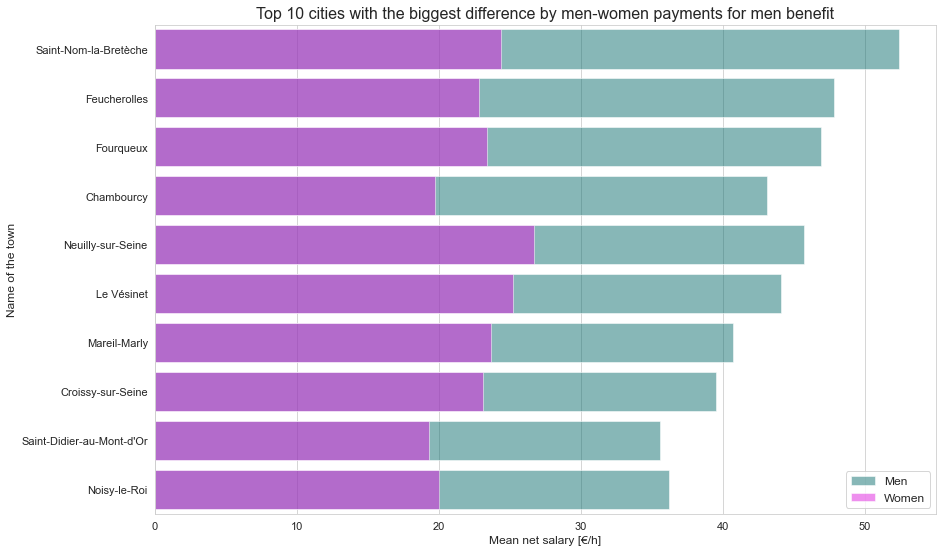

In [42]:
#choose 10 the best for men
salary_per_town_2_M = salary_per_town_2[:10]

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,9))

sns.barplot(data = salary_per_town_2_M, x = 'mean net salary for man', y = 'name of the town', alpha = 0.5, color = "#008080", label = 'Men')
sns.barplot(data = salary_per_town_2_M, x = 'mean net salary for women', y = 'name of the town', alpha = 0.5, color = "#FF00FF", label = 'Women')

ax.set_title("Top 10 cities with the biggest difference by men-women payments for men benefit", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Name of the town", fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)
ax.legend(fontsize = 12)

plt.show()

In the whole country there are only two towns where is noted higher average payment for women than men. However, the difference is slight.

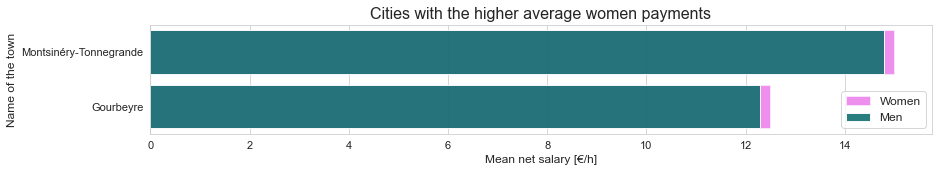

In [43]:
#choose 10 the best for women
salary_per_town_2_K = salary_per_town_2[salary_per_town_2['mean net salary for women'] > salary_per_town_2['mean net salary for man']]

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,2))

sns.barplot(data = salary_per_town_2_K, x = 'mean net salary for women', y = 'name of the town', alpha = 0.5, color = "#FF00FF", label = 'Women')   
sns.barplot(data = salary_per_town_2_K, x = 'mean net salary for man', y = 'name of the town', alpha = 0.9, color = "#008080", label = 'Men')

ax.set_title("Cities with the higher average women payments", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Name of the town", fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)
ax.legend(fontsize = 12)

plt.show()

In [44]:
#create df with the smallest salary gap per gender
salary_per_town_2_0 = salary_per_town_2[salary_per_town_2['gender payment difference (men - woman)'] < 0.5]

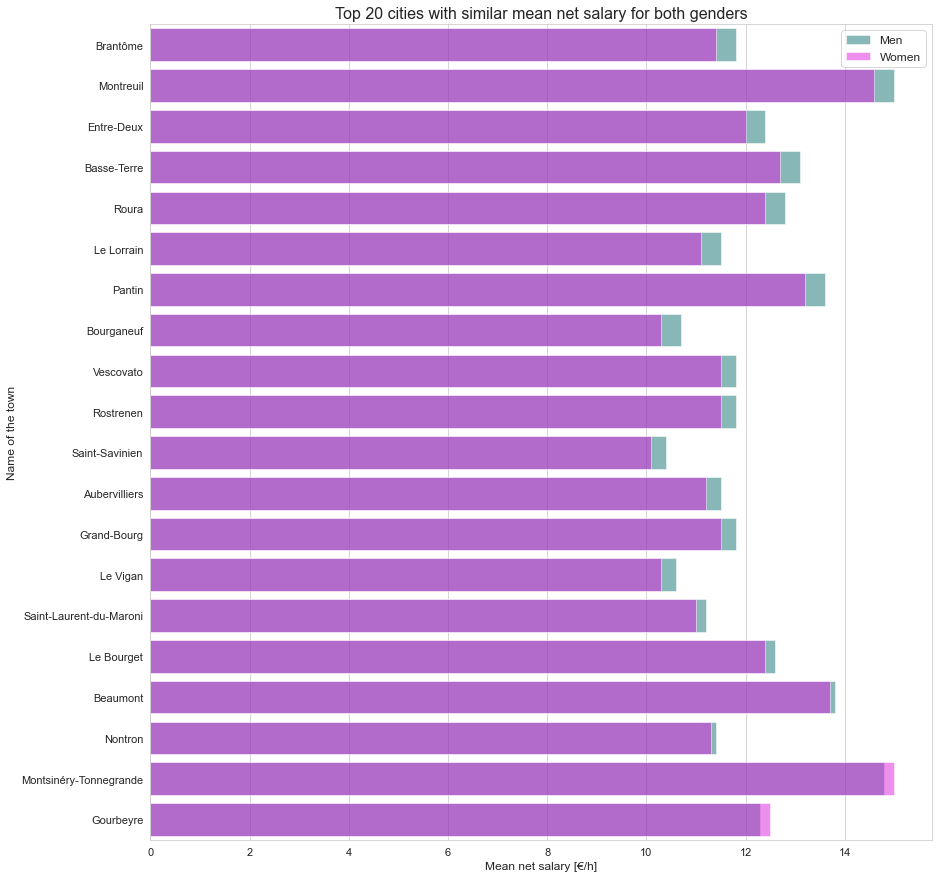

In [45]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,15))

sns.barplot(data = salary_per_town_2_0, x = 'mean net salary for man', y = 'name of the town', alpha = 0.5, color = "#008080", label = 'Men')
sns.barplot(data = salary_per_town_2_0, x = 'mean net salary for women', y = 'name of the town', alpha = 0.5, color = "#FF00FF", label = 'Women')   

ax.set_title("Top 20 cities with similar mean net salary for both genders", fontsize = 16)
ax.set_xlabel("Mean net salary [€/h]", fontsize = 12)
ax.set_ylabel("Name of the town", fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)
ax.legend(fontsize = 12)

plt.show()

### 3.3.3. Mean salary per town and age <a class="anchor" id="section_3_3_3"></a>

In [46]:
#create df with age and salary info only
salary_per_town_3 = data_1.loc[:, ["name of the town", "mean net salary per hour for 18-25 years old", "mean net salary per hour for 26-50 years old", "mean net salary per hour for >50 years old"]]

In [47]:
#calculate difference in payment by age
salary_per_town_3['Mean salary difference by Age'] = salary_per_town_3["mean net salary per hour for >50 years old"] - salary_per_town_3["mean net salary per hour for 18-25 years old"]

In [48]:
salary_per_town_3.sort_values(by = 'Mean salary difference by Age', ascending = False, inplace = True)

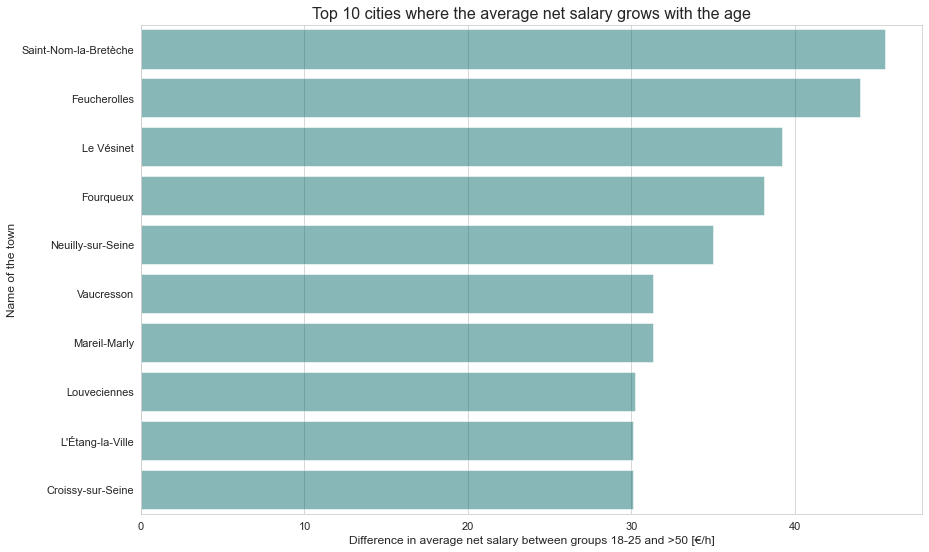

In [49]:
#choose 10 with the best age benefit 
salary_per_town_3_H = salary_per_town_3[:10]

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize = (14,9))

sns.barplot(data = salary_per_town_3_H, x = 'Mean salary difference by Age', y = 'name of the town', alpha = 0.5, color = "#008080")

ax.set_title("Top 10 cities where the average net salary grows with the age", fontsize = 16)
ax.set_xlabel("Difference in average net salary between groups 18-25 and >50 [€/h]", fontsize = 12)
ax.set_ylabel("Name of the town", fontsize = 12)
ax.tick_params(axis = 'both', which = 'major', labelsize = 11)

plt.show()

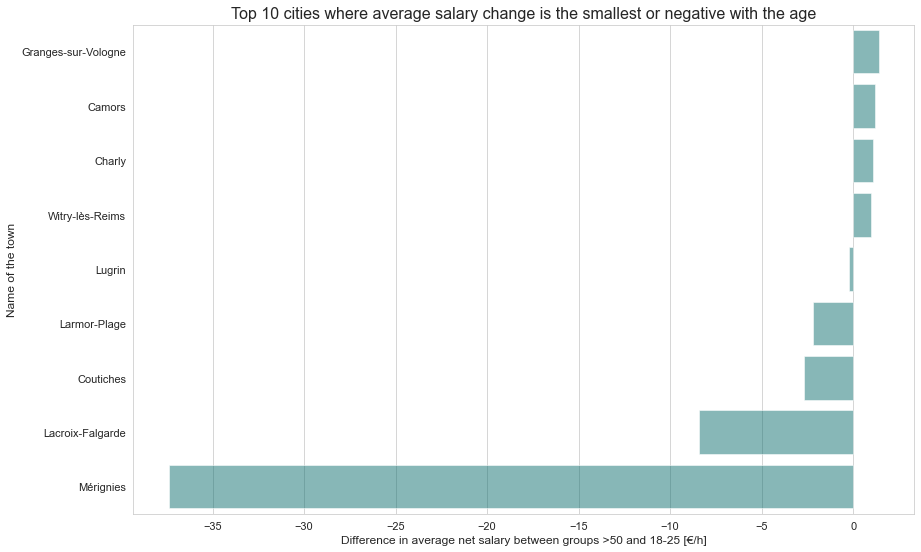

In [50]:
#choose 10 with the worst age benefit 
salary_per_town_3_H = salary_per_town_3[-9:]

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize=(14,9))

sns.barplot(data = salary_per_town_3_H, x = 'Mean salary difference by Age', y = 'name of the town', alpha=0.5, color="#008080")

ax.set_title("Top 10 cities where average salary change is the smallest or negative with the age", fontsize=16)
ax.set_xlabel("Difference in average net salary between groups >50 and 18-25 [€/h]" , fontsize=12)
ax.set_ylabel("Name of the town", fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=11)

plt.show()

In [51]:
#save report as html
!jupyter nbconvert "Report_net_salary_france.ipynb" --TagRemovePreprocessor.remove_cell_tags="{'hide'}" --TagRemovePreprocessor.remove_input_tags="{'hide_input'}" --to html --no-input

[NbConvertApp] Converting notebook Report_net_salary_france.ipynb to html
[NbConvertApp] Writing 6434500 bytes to Report_net_salary_france.html
